# **Installing and Importing Required Libraries**

In [ ]:
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 7.3 MB/s eta 0:00:00


In [ ]:
!pip install scikit-plot

In [ ]:
import numpy as np
import keras
import os
import glob
from skimage import io
import skimage
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from google.colab import drive
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow
import os
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
from sklearn.metrics import *
import scikitplot as skplt
from functools import partial
import albumentations as A
import seaborn as sns
from keras.callbacks import EarlyStopping
from keras.callbacks import ReduceLROnPlateau

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


# **Data Preparation**

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/My Drive/'


'AIC-2306_submission (1).gsheet'	'Getting started.pdf'		        takeimage.gsheet
 AIC-2306_submission.gsheet		 inbound2221658553711248513.pdf         takelabel.gsheet
 Assigment-3-BDS-Sp-2023.gdoc		'Invitation Letter Ideas Xtreme.gdoc'   Test.gsheet
 Assignment-II-BDS.gdoc			'Lecture Slides.gslides'	       'Testing Image'
 Classroom				 Modified_Testing_Images	       'Testing Images'
'Colab Notebooks'			'< My Ideal Person >.gdoc'	        Train.gsheet
'Copy of Assigment-3-BDS-Sp-2023.docx'	'predicted_labels (1).gsheet'	       'Training Image'
 fiza.gsheet				 softec-aic-2024		       'Training Images'
 Fiza_task10.gdoc			 Softec.gdoc			        Training_output


In [ ]:
# Set the path to the image folder
images_folder = "/content/drive/My Drive/Training Images"

# Read the CSV file
df_csv = pd.read_csv('Train.csv')

# Add a new column for image paths in the CSV DataFrame
df_csv['Image_Path'] = df_csv['Image'].apply(lambda x: os.path.join(images_folder, f"{x}.jpg"))

# Display the updated DataFrame
print(df_csv)


     Image    Label                                       Image_Path
0        0   Normal    /content/drive/My Drive/Training Images/0.jpg
1        1  Mitosis    /content/drive/My Drive/Training Images/1.jpg
2        2   Normal    /content/drive/My Drive/Training Images/2.jpg
3        3  Mitosis    /content/drive/My Drive/Training Images/3.jpg
4        4  Mitosis    /content/drive/My Drive/Training Images/4.jpg
..     ...      ...                                              ...
221    221   Normal  /content/drive/My Drive/Training Images/221.jpg
222    222  Mitosis  /content/drive/My Drive/Training Images/222.jpg
223    223  Mitosis  /content/drive/My Drive/Training Images/223.jpg
224    224  Mitosis  /content/drive/My Drive/Training Images/224.jpg
225    225  Mitosis  /content/drive/My Drive/Training Images/225.jpg

[226 rows x 3 columns]


In [ ]:
# Set the path to the image folder
images_folder = "/content/drive/My Drive/Training Image/"

# Read the CSV file
df2_csv = pd.read_csv('Training.csv')

df =  df2_csv

df['Image'] = df['Image'].astype(str)

df2_csv['Image_Path'] = df['Image'].apply(lambda x: os.path.join(images_folder, x))



In [ ]:
# Concatenate the two DataFrames along the rows
merged_df = pd.concat([df_csv, df2_csv], ignore_index=True)

# Display the merged DataFrame
print(merged_df)

# Save the merged DataFrame to a new CSV file
merged_df.to_csv('pl.csv', index=False)


             Image    Label                                         Image_Path
0                0   Normal      /content/drive/My Drive/Training Images/0.jpg
1                1  Mitosis      /content/drive/My Drive/Training Images/1.jpg
2                2   Normal      /content/drive/My Drive/Training Images/2.jpg
3                3  Mitosis      /content/drive/My Drive/Training Images/3.jpg
4                4  Mitosis      /content/drive/My Drive/Training Images/4.jpg
..             ...      ...                                                ...
287  1500_1500.png  Mitosis  /content/drive/My Drive/Training Image/1500_15...
288     1000_0.png   Normal  /content/drive/My Drive/Training Image/1000_0.png
289  7000_4000.png   Normal  /content/drive/My Drive/Training Image/7000_40...
290  2500_1000.png   Normal  /content/drive/My Drive/Training Image/2500_10...
291  7000_3000.png  Mitosis  /content/drive/My Drive/Training Image/7000_30...

[292 rows x 3 columns]


In [ ]:
# Set the path to the image folder
images_folder = "/content/drive/My Drive/Testing Image"

# Read the CSV file
df_test = pd.read_csv('Testing.csv')

df =  df_test

df['Image'] = df['Image'].astype(str)

df_test['Image_Path'] = df['Image'].apply(lambda x: os.path.join(images_folder, x))

# Display the updated DataFrame
print(df_test)

# Save the updated DataFrame back to a new CSV file
df_test.to_csv('pt.csv', index=False)

            Image                                         Image_Path
0   4000_1000.png  /content/drive/My Drive/Testing Image/4000_100...
1   2000_3500.png  /content/drive/My Drive/Testing Image/2000_350...
2   5500_2500.png  /content/drive/My Drive/Testing Image/5500_250...
3   1000_4500.png  /content/drive/My Drive/Testing Image/1000_450...
4   2500_2000.png  /content/drive/My Drive/Testing Image/2500_200...
..            ...                                                ...
94  1000_4000.png  /content/drive/My Drive/Testing Image/1000_400...
95  1500_2500.png  /content/drive/My Drive/Testing Image/1500_250...
96  5500_4000.png  /content/drive/My Drive/Testing Image/5500_400...
97  6500_2500.png  /content/drive/My Drive/Testing Image/6500_250...
98  1500_4500.png  /content/drive/My Drive/Testing Image/1500_450...

[99 rows x 2 columns]


p

In [ ]:
data = pd.read_csv("pl.csv")
data.head()

,Image,Label,Image_Path
0,0,Normal,/content/drive/My Drive/Training Images/0.jpg
1,1,Mitosis,/content/drive/My Drive/Training Images/1.jpg
2,2,Normal,/content/drive/My Drive/Training Images/2.jpg
3,3,Mitosis,/content/drive/My Drive/Training Images/3.jpg
4,4,Mitosis,/content/drive/My Drive/Training Images/4.jpg


In [ ]:
def convert_label(label):
    if label == "Mitosis":
        return 1
    elif label == "Normal":
        return 0
    else:
        raise ValueError(f"Unexpected label value: {label}")

data["label_int"] = data["Label"].apply(convert_label)

data.head()

,Image,Label,Image_Path,label_int
0,0,Normal,/content/drive/My Drive/Training Images/0.jpg,0
1,1,Mitosis,/content/drive/My Drive/Training Images/1.jpg,1
2,2,Normal,/content/drive/My Drive/Training Images/2.jpg,0
3,3,Mitosis,/content/drive/My Drive/Training Images/3.jpg,1
4,4,Mitosis,/content/drive/My Drive/Training Images/4.jpg,1


# **Data Analysis, EDA**

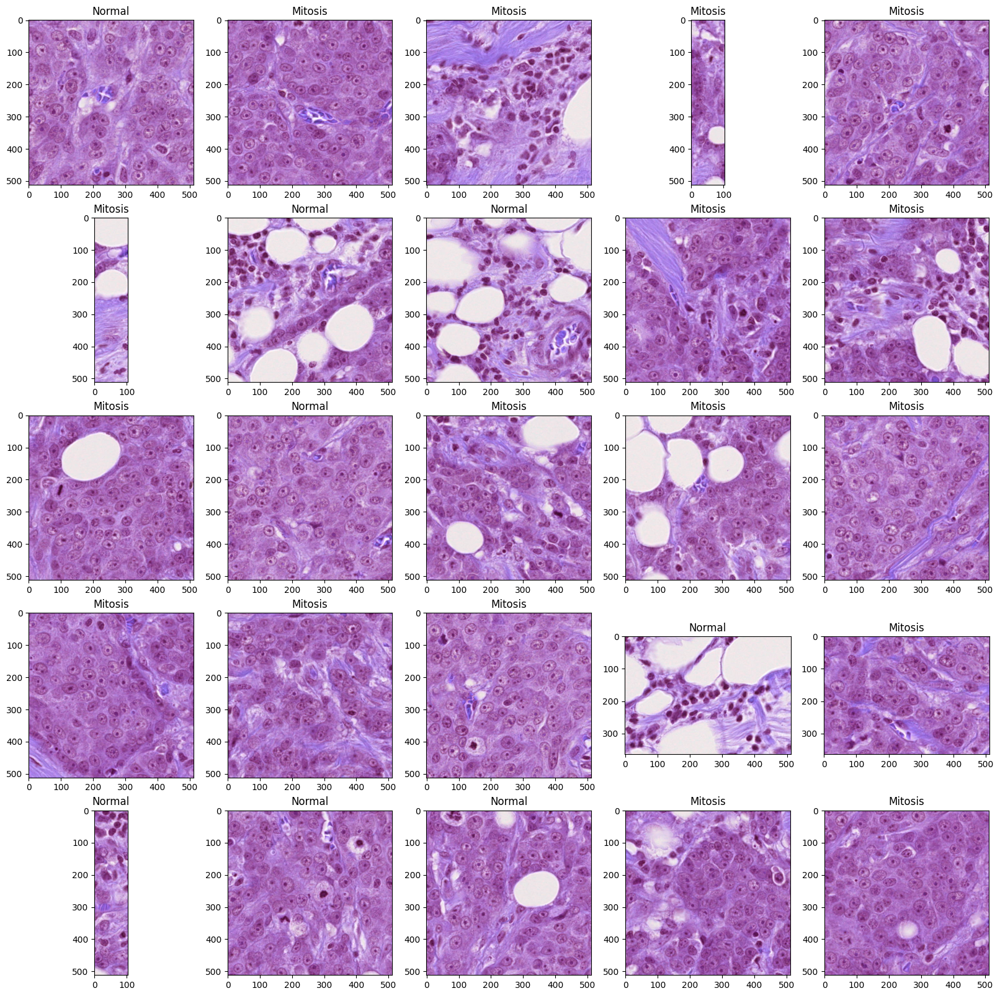

In [ ]:
n = 25

plt.figure(figsize=(20,20))

for i in range(n):
    ax = plt.subplot(5, 5, i+1)
    plt.title(df2_csv['Label'][i])
    image_path = df2_csv['Image_Path'][i]
    image = cv2.imread(image_path)
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)

p

Count of Normal    :  164
Count of Mitosis :  128


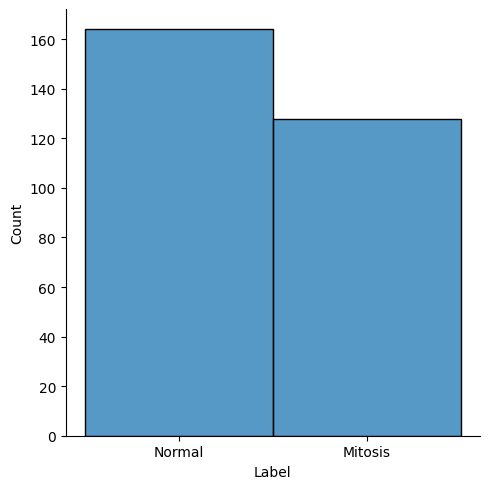

In [ ]:
ax = sns.displot(data=data, x='Label')
print('Count of Normal    : ', data[data.Label == 'Normal'].Label.count())
print('Count of Mitosis : ', data[data.Label == 'Mitosis'].Label.count())

Training set
Normal     127
Mitosis     95
Name: Label, dtype: int64

Validation set
Normal     30
Mitosis    26
Name: Label, dtype: int64

Test set
Mitosis    7
Normal     7
Name: Label, dtype: int64


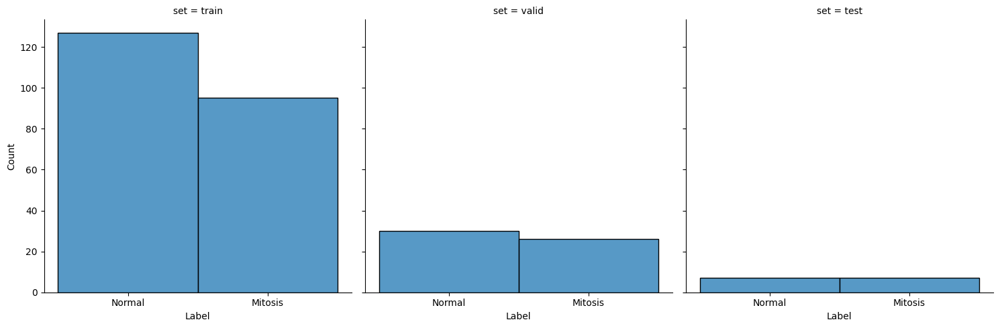

In [ ]:
# remove 600 from dataset for testing
test_df = data.groupby('Label').sample(n=7)
train_df = data.drop(test_df.index).reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# split training and validation set
valid_df = train_df.sample(frac=0.2)
train_df = train_df.drop(valid_df.index).reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)

test_df['set'] = 'test'
train_df['set'] = 'train'
valid_df['set'] = 'valid'
data_new = pd.concat([train_df,valid_df, test_df])

ax = sns.displot(data=data_new, x='Label', col='set')

print('Training set')
print(train_df.Label.value_counts())

print('\nValidation set')
print(valid_df.Label.value_counts())

print('\nTest set')
print(test_df.Label.value_counts())

p

Count of Normal    :  164
Count of Mitosis :  128


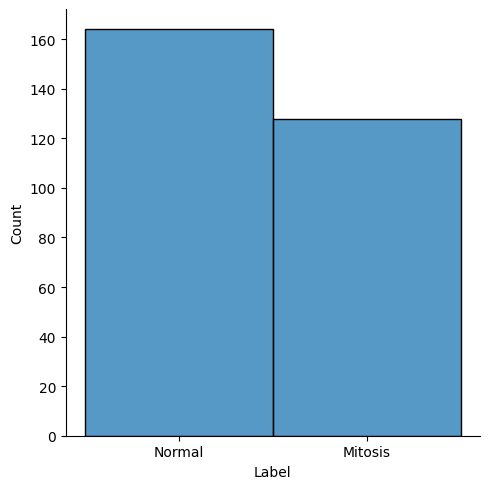

In [ ]:
ax = sns.displot(data=data, x='Label')
print('Count of Normal    : ', data[data.Label == 'Normal'].Label.count())
print('Count of Mitosis : ', data[data.Label == 'Mitosis'].Label.count())

Training set
Normal     119
Mitosis    103
Name: Label, dtype: int64

Validation set
Normal     38
Mitosis    18
Name: Label, dtype: int64

Test set
Mitosis    7
Normal     7
Name: Label, dtype: int64


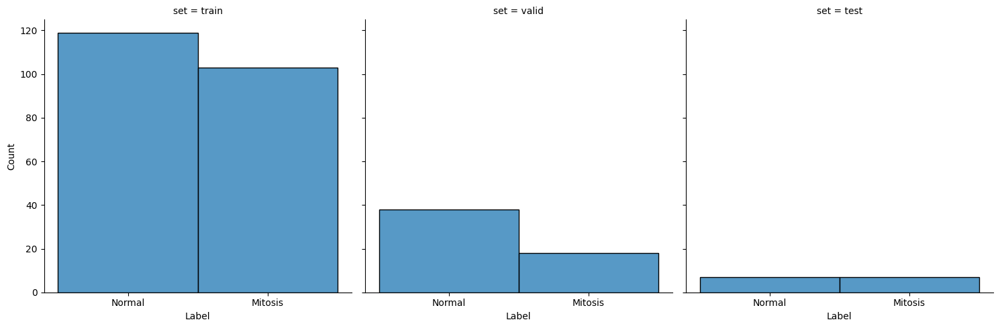

In [ ]:
# remove 600 from dataset for testing
test_df = data.groupby('Label').sample(n=7)
train_df = data.drop(test_df.index).reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# split training and validation set
valid_df = train_df.sample(frac=0.2)
train_df = train_df.drop(valid_df.index).reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)

test_df['set'] = 'test'
train_df['set'] = 'train'
valid_df['set'] = 'valid'
data_new = pd.concat([train_df,valid_df, test_df])

ax = sns.displot(data=data_new, x='Label', col='set')

print('Training set')
print(train_df.Label.value_counts())

print('\nValidation set')
print(valid_df.Label.value_counts())

print('\nTest set')
print(test_df.Label.value_counts())

Display Random Images


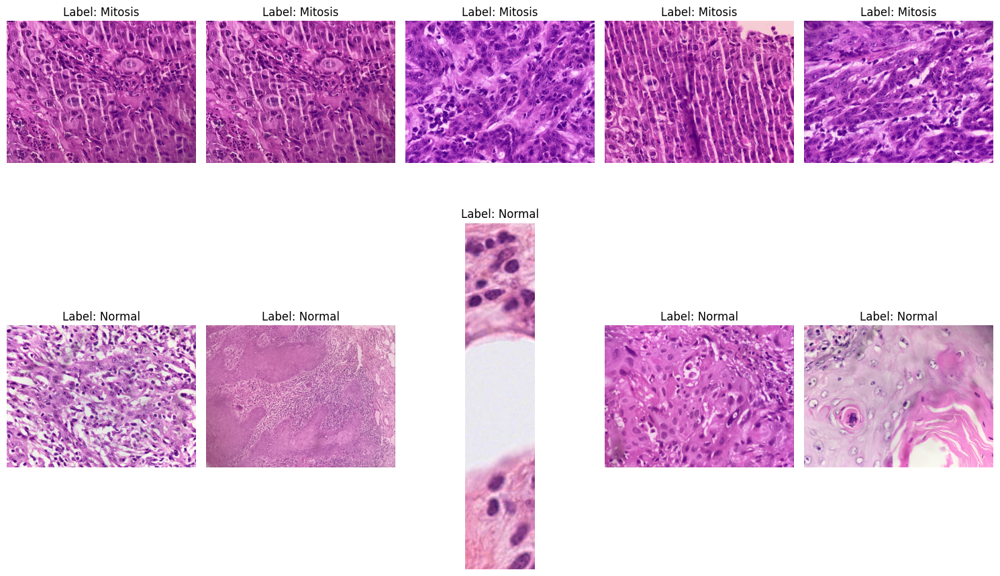

In [ ]:
# Separate the DataFrame into 'Mitosis' and 'Normal' subsets
mitosis_df = train_df[train_df['Label'] == 'Mitosis']
normal_df = train_df[train_df['Label'] == 'Normal']

# Extract 5 random images with 'Mitosis' label
random_mitosis_images = [np.random.choice(mitosis_df['Image_Path']) for i in range(5)]

# Extract 5 random images with 'Normal' label
random_normal_images = [np.random.choice(normal_df['Image_Path']) for i in range(5)]

# Combine the two sets of random images
random_images = random_mitosis_images + random_normal_images

# Location of the image directory
img_dir = "/content/drive/My Drive/Training Images"

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(15, 10))

# Iterate and plot random images
for i in range(10):
    plt.subplot(2, 5, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.title(f"Label: {train_df.loc[train_df['Image_Path'] == random_images[i], 'Label'].values[0]}")
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()

In [ ]:
from collections import defaultdict
img_data = defaultdict(list)

for i in range(len(train_df)):
    image_path = df_csv['Image_Path'][i]
    image = cv2.imread(image_path)
    height, width, channels = image.shape
    img_data['width'].append(width)
    img_data['height'].append(height)
    img_data['size'].append(round(os.path.getsize(image_path) / 1e6, 2))

image_data = pd.DataFrame(img_data)
image_data['img_aspect_ratio'] = image_data['width']/image_data['height']
image_data.reset_index(inplace=True, drop=True)

image_data.head()

,width,height,size,img_aspect_ratio
0,4032,3024,1.97,1.333333
1,4032,3024,2.23,1.333333
2,4032,3024,1.58,1.333333
3,4032,3024,1.24,1.333333
4,4032,3024,1.87,1.333333


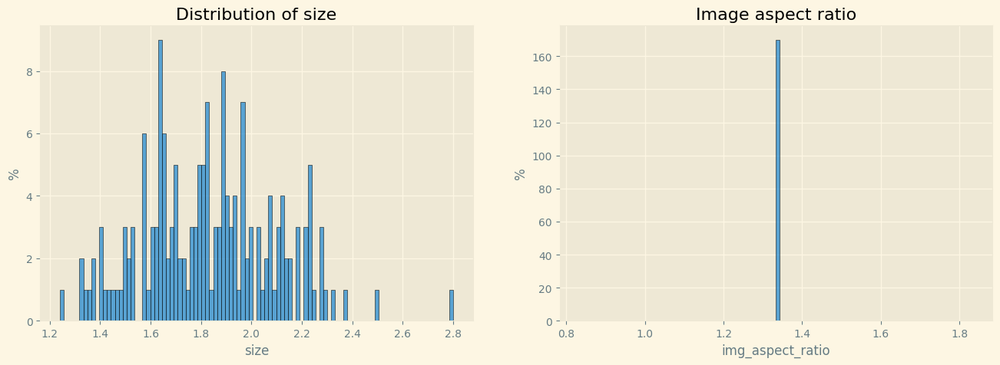

In [ ]:
import seaborn as sns

plt.style.use('Solarize_Light2')

fig, ax = plt.subplots(1,2, figsize=(16,5))
sns.histplot(x='size', data = image_data, bins=100, ax=ax[0])
ax[0].set_title("Distribution of size"), ax[0].set_ylabel("%")
sns.histplot(x='img_aspect_ratio', data = image_data, bins=100, ax=ax[1])
ax[1].set_title("Image aspect ratio"), ax[1].set_ylabel("%")
plt.show()


Image 1 - 209.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 170.7
Standard deviation : 54.5

Image 2 - 102.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 145.3
Standard deviation : 67.4

Image 3 - 131.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 20.0
Mean value of the pixels : 168.5
Standard deviation : 43.2

Image 4 - 39.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 165.9
Standard deviation : 42.2

Image 5 - 64.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 170.7
Standard deviation : 55.0


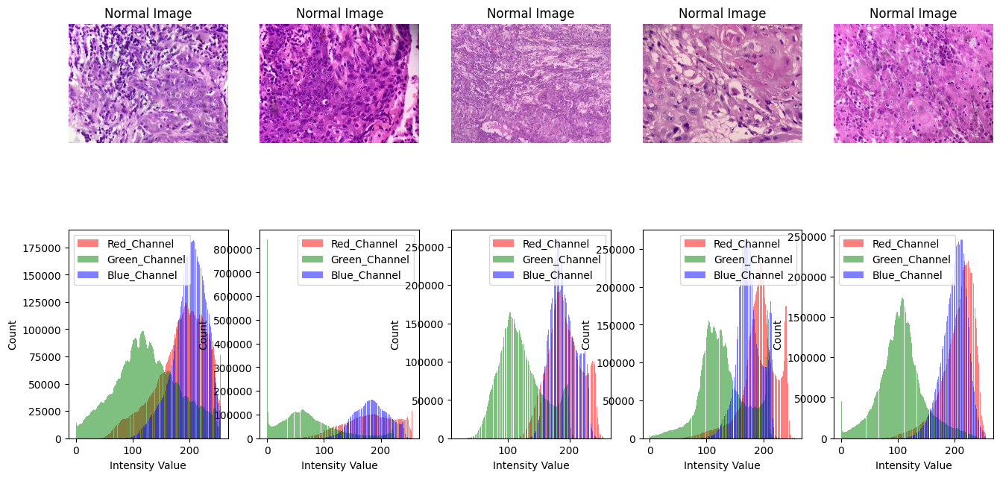

In [ ]:
normal_indices = train_df[train_df['Label'] == 'Normal']['Image'].tolist()

# Display histograms for 5 random normal images
f = plt.figure(figsize=(16, 8))

for i in range(5):
    f.add_subplot(2, 5, i + 1)
    sample_img = str(np.random.choice(normal_indices)) + '.jpg'  # Convert the integer to a string
    raw_image = plt.imread(os.path.join(img_dir, sample_img))
    plt.imshow(raw_image, cmap='gray')
    plt.axis('off')
    plt.title('Normal Image')

    f.add_subplot(2, 5, i + 6)
    # Display the pixel intensity histograms
    _ = plt.hist(raw_image[:, :, 0].ravel(), bins=256, color='red', alpha=0.5)
    _ = plt.hist(raw_image[:, :, 1].ravel(), bins=256, color='green', alpha=0.5)
    _ = plt.hist(raw_image[:, :, 2].ravel(), bins=256, color='blue', alpha=0.5)
    _ = plt.xlabel('Intensity Value')
    _ = plt.ylabel('Count')
    _ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])

    # Print image statistics
    print(f"\nImage {i + 1} - {sample_img}")
    print(f"Image dimensions:  {raw_image.shape[0], raw_image.shape[1]}")
    print(f"Maximum pixel value : {raw_image.max():.1f}")
    print(f"Minimum pixel value : {raw_image.min():.1f}")
    print(f"Mean value of the pixels : {raw_image.mean():.1f}")
    print(f"Standard deviation : {raw_image.std():.1f}")

plt.show()



Image 1 - 92.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 147.3
Standard deviation : 62.6

Image 2 - 197.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 155.2
Standard deviation : 61.2

Image 3 - 26.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 169.5
Standard deviation : 41.2

Image 4 - 155.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 143.8
Standard deviation : 58.1

Image 5 - 54.jpg
Image dimensions:  (3024, 4032)
Maximum pixel value : 255.0
Minimum pixel value : 0.0
Mean value of the pixels : 145.7
Standard deviation : 58.6


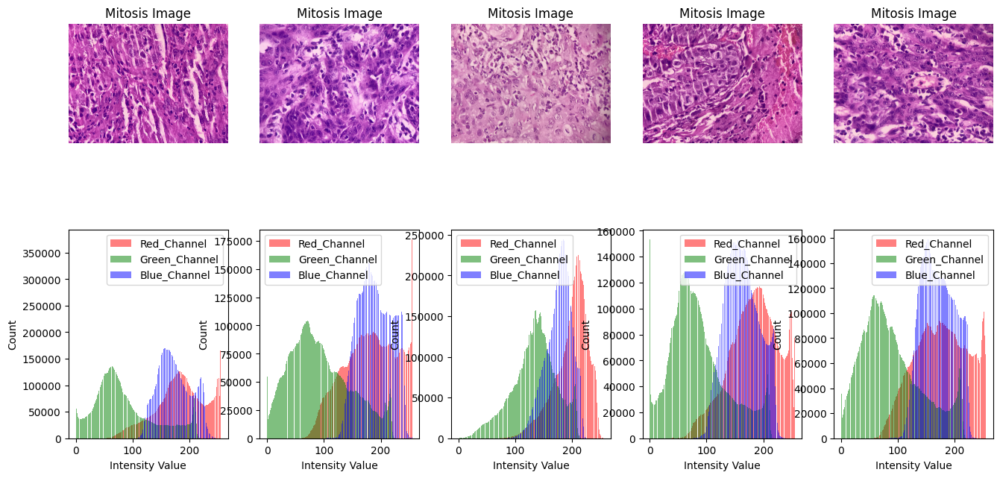

In [ ]:
mitosis_indices = train_df[train_df['Label'] == 'Mitosis']['Image'].tolist()

# Display histograms for 5 random normal images
f = plt.figure(figsize=(16, 8))

for i in range(5):
    f.add_subplot(2, 5, i + 1)
    sample_img = str(np.random.choice(mitosis_indices)) + '.jpg'  # Convert the integer to a string
    raw_image = plt.imread(os.path.join(img_dir, sample_img))
    plt.imshow(raw_image, cmap='gray')
    plt.axis('off')
    plt.title('Mitosis Image')

    f.add_subplot(2, 5, i + 6)
    # Display the pixel intensity histograms
    _ = plt.hist(raw_image[:, :, 0].ravel(), bins=256, color='red', alpha=0.5)
    _ = plt.hist(raw_image[:, :, 1].ravel(), bins=256, color='green', alpha=0.5)
    _ = plt.hist(raw_image[:, :, 2].ravel(), bins=256, color='blue', alpha=0.5)
    _ = plt.xlabel('Intensity Value')
    _ = plt.ylabel('Count')
    _ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])

    # Print image statistics
    print(f"\nImage {i + 1} - {sample_img}")
    print(f"Image dimensions:  {raw_image.shape[0], raw_image.shape[1]}")
    print(f"Maximum pixel value : {raw_image.max():.1f}")
    print(f"Minimum pixel value : {raw_image.min():.1f}")
    print(f"Mean value of the pixels : {raw_image.mean():.1f}")
    print(f"Standard deviation : {raw_image.std():.1f}")

plt.show()


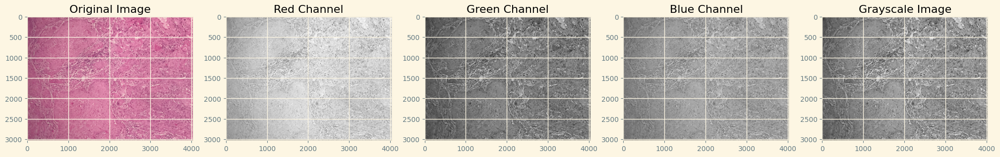

In [ ]:
normal_indices = train_df[train_df['Label'] == 'Normal']['Image'].tolist()

# Choose a random normal image
sample_img = str(np.random.choice(normal_indices)) + '.jpg'
raw_image = plt.imread(os.path.join(img_dir, sample_img))

# Convert the image to grayscale
gray_image = skimage.color.rgb2gray(raw_image)

# Plotting the original image and its RGB channels
f, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot the original image
axs[0].imshow(raw_image)
axs[0].set_title('Original Image')

# Plot the RGB channels
for i, channel in enumerate(['Red Channel', 'Green Channel', 'Blue Channel']):
    axs[i+1].imshow(raw_image[:, :, i], cmap='gray', vmin=0, vmax=255)
    axs[i+1].set_title(channel)

# Plot the grayscale image
axs[-1].imshow(gray_image, cmap='gray')
axs[-1].set_title('Grayscale Image')

plt.show()


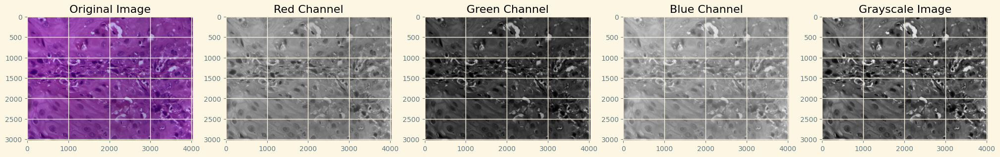

In [ ]:
mitosis_indices = train_df[train_df['Label'] == 'Mitosis']['Image'].tolist()

# Choose a random normal image
sample_img = str(np.random.choice(mitosis_indices)) + '.jpg'
raw_image = plt.imread(os.path.join(img_dir, sample_img))

# Convert the image to grayscale
gray_image = skimage.color.rgb2gray(raw_image)

# Plotting the original image and its RGB channels
f, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot the original image
axs[0].imshow(raw_image)
axs[0].set_title('Original Image')

# Plot the RGB channels
for i, channel in enumerate(['Red Channel', 'Green Channel', 'Blue Channel']):
    axs[i+1].imshow(raw_image[:, :, i], cmap='gray', vmin=0, vmax=255)
    axs[i+1].set_title(channel)

# Plot the grayscale image
axs[-1].imshow(gray_image, cmap='gray')
axs[-1].set_title('Grayscale Image')

plt.show()


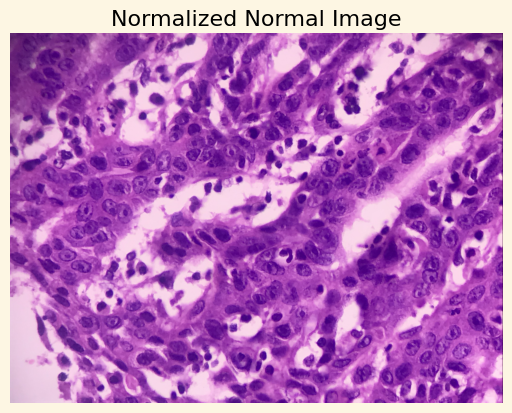

In [ ]:
normal_indices = train_df[train_df['Label'] == 'Normal']['Image'].tolist()

# Choose a random normal image
sample_img = str(np.random.choice(normal_indices)) + '.jpg'
raw_image = plt.imread(os.path.join(img_dir, sample_img))

# Normalize the original image
norm_image = (raw_image - np.min(raw_image)) / (np.max(raw_image) - np.min(raw_image))

# Display the normalized original image
plt.imshow(norm_image)
plt.title('Normalized Normal Image')
plt.axis('off')
plt.show()


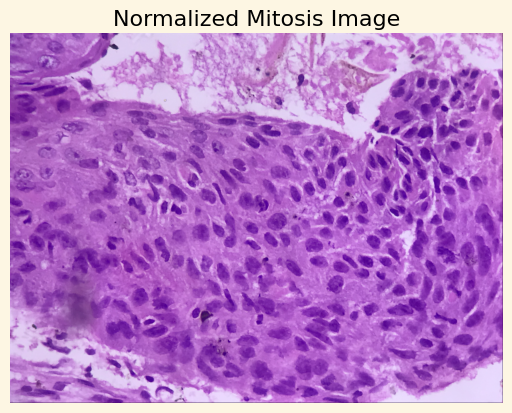

In [ ]:
mitosis_indices = train_df[train_df['Label'] == 'Mitosis']['Image'].tolist()

# Choose a random normal image
sample_img = str(np.random.choice(mitosis_indices)) + '.jpg'
raw_image = plt.imread(os.path.join(img_dir, sample_img))

# Normalize the original image
norm_image = (raw_image - np.min(raw_image)) / (np.max(raw_image) - np.min(raw_image))

# Display the normalized original image
plt.imshow(norm_image)
plt.title('Normalized Mitosis Image')
plt.axis('off')
plt.show()


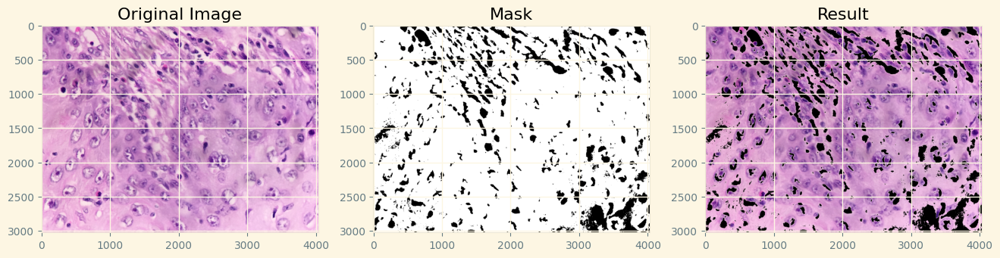

In [ ]:
normal_indices = train_df[train_df['Label'] == 'Normal'].index.tolist()

# Choose a random normal image
random_normal_index = np.random.choice(normal_indices)
image_path = train_df.loc[random_normal_index, 'Image_Path']

# Read the image
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define HSV color boundaries
boundaries = [([130, 50, 50], [160, 255, 255])]

# Convert the boundaries to NumPy arrays
lowerb = np.array(boundaries[0][0])
upperb = np.array(boundaries[0][1])

# Convert the image to HSV
hsv_image = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

# Create a mask based on the defined boundaries
mask = cv2.inRange(hsv_image, lowerb, upperb)

# Apply the mask to the original image
result = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Plot the original image, mask, and result side by side
plt.figure(figsize=(16, 8))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')

plt.subplot(1, 3, 3)
plt.imshow(result)
plt.title('Result')

plt.show()

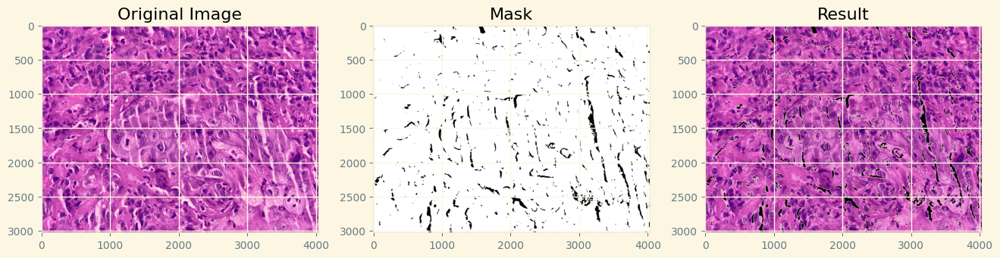

In [ ]:
mitosis_indices = train_df[train_df['Label'] == 'Mitosis'].index.tolist()

# Choose a random normal image
random_normal_index = np.random.choice(mitosis_indices)
image_path = train_df.loc[random_normal_index, 'Image_Path']

# Read the image
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define HSV color boundaries
boundaries = [([130, 50, 50], [160, 255, 255])]

# Convert the boundaries to NumPy arrays
lowerb = np.array(boundaries[0][0])
upperb = np.array(boundaries[0][1])

# Convert the image to HSV
hsv_image = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

# Create a mask based on the defined boundaries
mask = cv2.inRange(hsv_image, lowerb, upperb)

# Apply the mask to the original image
result = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Plot the original image, mask, and result side by side
plt.figure(figsize=(16, 8))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')

plt.subplot(1, 3, 3)
plt.imshow(result)
plt.title('Result')

plt.show()

# **Data Preprocessing**

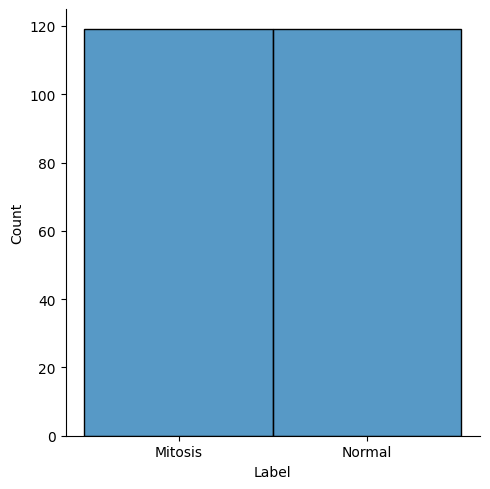

In [ ]:
# upsampling training dataset
max_count = np.max(train_df.Label.value_counts())
min_count = np.min(train_df.Label.value_counts())
train_df = train_df.groupby('Label').sample(n=max_count, replace=True)
train_df = train_df.reset_index(drop=True)
train_df.Label.value_counts()

ax = sns.displot(data=train_df, x='Label')

In [ ]:
def parse_image(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img, label

def resize_rescale(image, label):
    img = tf.cast(image, tf.float32)
    img = tf.image.resize(img, [IMAGE_SIZE, IMAGE_SIZE])/255
    return img, label

def resize_rescale(image, label):
    img = tf.cast(image, tf.float32)
    img = tf.image.resize(img, [IMAGE_SIZE, IMAGE_SIZE])
    img = img / 255.0
    return img, label

def aug_fn(image):
    transforms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(p=0.5, limit=30),  # Increase rotation limit
    A.RandomBrightnessContrast(p=0.5, brightness_limit=(-0.3, 0.3), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
    A.RandomResizedCrop(p=0.8, height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.8, 1.2), ratio=(0.05, 1.1), interpolation=0),
    A.Blur(p=0.3, blur_limit=(1, 3)),  # Increase blur limit
])
    data = {"image":image}
    aug_data = transforms(**data)
    aug_img = aug_data["image"]
    aug_img = tf.cast(aug_img, tf.float32)
    aug_img = tf.image.resize(aug_img, [IMAGE_SIZE, IMAGE_SIZE])/255
    return aug_img

def augmentor(image, label):
    aug_img = tf.numpy_function(func=aug_fn, inp=[image], Tout=tf.float32)
    return aug_img, label


# **Model Selection and Optimization**

In [ ]:
def view_image(ds, col=8, row=2, size=(25,7)):
    plt.figure(figsize=size)
    plt.subplots_adjust(wspace=0.05, hspace=0.15)
    for images, labels in ds.take(1):
        for i in range(col*row):
            ax = plt.subplot(row, col, i + 1)
            shape = str(images[i].numpy().shape)
            plt.imshow(images[i].numpy())
            plt.title(class_names[labels[i].numpy()])
            plt.axis("off")
    plt.tight_layout
    return None

def training_history(history):
    accuracy = history['accuracy']
    val_accuracy = history['val_accuracy']

    loss = history['loss']
    val_loss = history['val_loss']

    epochs_range = range(len(history['loss']))

    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, accuracy, label='Training accuracy')
    plt.plot(epochs_range, val_accuracy, label='Validation accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Loss')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')

    plt.show()
    return None

def decode_test(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, [224, 224])/255
    return img


def build_network(image_size):
    print('building model...')
    base_model = hub.KerasLayer(model_handle, trainable=True, name='base_model')

    # Freeze the layers of the base model
    base_model.trainable = False

    model = tf.keras.Sequential([
        layers.InputLayer(input_shape=(image_size, image_size, 3)),
        base_model,
        layers.Reshape((-1,)),  # Flatten the output to a 1D tensor
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dense(1, activation='sigmoid', name='classifier')
    ], name=model_name)

    model.build((None, image_size, image_size, 3))
    model.summary()
    print('model loaded!!!')

    return model


def view_prediction():
    plt.figure(figsize=(25,8))
    plt.rcParams.update({'font.size': 8})
    plt.subplots_adjust(wspace=0.05, hspace=0.15)
    for i in range(30):
        ax = plt.subplot(3, 10, i + 1)
        shape = str(test_img[i].numpy().shape)
        plt.imshow(test_img[i].numpy())
        plt.title(pred_label[i][0])
        plt.axis("off")
        plt.tight_layout
    return None

def view_wrong_prediction(df):
    plt.figure(figsize=(len(df)*4,8))
    plt.rcParams.update({'font.size': 8})
    plt.subplots_adjust(wspace=0.05, hspace=0.15)
    for i in range(len(df)):
        img = decode_test(df.Image_Path.iloc[i])
        ax = plt.subplot(1, len(df), i + 1)
        plt.imshow(img)
        plt.title('wrongly predicted as '+df.prediction.iloc[i])
        plt.axis("off")
        plt.tight_layout
    return None

In [ ]:
model_handle_map = {
  "efficientnetv2-s": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_s/feature_vector/1",
  "efficientnetv2-m": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_m/feature_vector/1",
  "efficientnetv2-l": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_l/feature_vector/1",
  "efficientnetv2-s-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_s/feature_vector/1",
  "efficientnetv2-m-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_m/feature_vector/1",
  "efficientnetv2-l-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_l/feature_vector/1",
  "efficientnetv2-s-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_s/feature_vector/1",
  "efficientnetv2-m-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_m/feature_vector/1",
  "efficientnetv2-l-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_l/feature_vector/1",
  "efficientnetv2-b0": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2",
  "efficientnetv2-b1": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b1/feature_vector/1",
  "efficientnetv2-b2": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b2/feature_vector/1",
  "efficientnetv2-b3": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b3/feature_vector/1",
  "efficientnet_b0": "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1",
  "efficientnet_b1": "https://tfhub.dev/tensorflow/efficientnet/b1/feature-vector/1",
  "efficientnet_b2": "https://tfhub.dev/tensorflow/efficientnet/b2/feature-vector/1",
  "efficientnet_b3": "https://tfhub.dev/tensorflow/efficientnet/b3/feature-vector/1",
  "efficientnet_b4": "https://tfhub.dev/tensorflow/efficientnet/b4/feature-vector/1",
  "efficientnet_b5": "https://tfhub.dev/tensorflow/efficientnet/b5/feature-vector/1",
  "efficientnet_b6": "https://tfhub.dev/tensorflow/efficientnet/b6/feature-vector/1",
  "efficientnet_b7": "https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1",
  "bit_s-r50x1": "https://tfhub.dev/google/bit/s-r50x1/1",
  "inception_v3": "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/4",
  "inception_resnet_v2": "https://tfhub.dev/google/imagenet/inception_resnet_v2/feature-vector/4",
  "resnet_v1_50": "https://tfhub.dev/google/imagenet/resnet_v1_50/feature-vector/4",
  "resnet_v1_101": "https://tfhub.dev/google/imagenet/resnet_v1_101/feature-vector/4",
  "resnet_v1_152": "https://tfhub.dev/google/imagenet/resnet_v1_152/feature-vector/4",
  "resnet_v2_50": "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/5",
  "resnet_v2_101": "https://tfhub.dev/google/imagenet/resnet_v2_101/feature_vector/5",
  "resnet_v2_152": "https://tfhub.dev/google/imagenet/resnet_v2_152/feature-vector/4",
  "nasnet_large": "https://tfhub.dev/google/imagenet/nasnet_large/feature_vector/4",
  "nasnet_mobile": "https://tfhub.dev/google/imagenet/nasnet_mobile/feature_vector/4",
  "pnasnet_large": "https://tfhub.dev/google/imagenet/pnasnet_large/feature_vector/4",
  "mobilenet_v2_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4",
  "mobilenet_v2_130_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4",
  "mobilenet_v2_140_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/feature_vector/4",
  "mobilenet_v3_small_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5",
  "mobilenet_v3_small_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_075_224/feature_vector/5",
  "mobilenet_v3_large_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/feature_vector/5",
  "mobilenet_v3_large_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/feature_vector/5",
}

model_image_size_map = {
  "efficientnetv2-s": 384,
  "efficientnetv2-m": 480,
  "efficientnetv2-l": 480,
  "efficientnetv2-s-21k": 384,
  "efficientnetv2-m-21k": 480,
  "efficientnetv2-l-21k": 480,
  "efficientnetv2-s-21k-ft1k": 384,
  "efficientnetv2-m-21k-ft1k": 480,
  "efficientnetv2-l-21k-ft1k": 480,
  "efficientnetv2-b0": 224,
  "efficientnetv2-b1": 240,
  "efficientnetv2-b2": 260,
  "efficientnetv2-b3": 300,
  "efficientnet_b0": 224,
  "efficientnet_b1": 240,
  "efficientnet_b2": 260,
  "efficientnet_b3": 300,
  "efficientnet_b4": 380,
  "efficientnet_b5": 456,
  "efficientnet_b6": 528,
  "efficientnet_b7": 600,
  "inception_v3": 299,
  "inception_resnet_v2": 299,
  "nasnet_large": 331,
  "pnasnet_large": 331,
}

In [ ]:
model_name = 'efficientnetv2-b0'
model_handle = model_handle_map.get(model_name)
IMAGE_SIZE = model_image_size_map.get(model_name, 224)
BATCH_SIZE = 16
EPOCHS = 20
SAMPLE_SIZE = len(train_df)

print(f"Selected model: {model_name} : {model_handle}")
print(f"Input size {IMAGE_SIZE}")

Selected model: efficientnetv2-b0 : https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2
Input size 224


In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [ ]:
train_loader = tf.data.Dataset.from_tensor_slices((train_df.Image_Path, train_df.label_int))
valid_loader = tf.data.Dataset.from_tensor_slices((valid_df.Image_Path, valid_df.label_int))

train_ds = (
    train_loader.shuffle(len(train_df))
    .map(parse_image, num_parallel_calls=AUTOTUNE)
    .map(augmentor, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

valid_ds = (
    valid_loader.shuffle(len(valid_df))
    .map(parse_image, num_parallel_calls=AUTOTUNE)
    .map(augmentor, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)


In [ ]:
tf.keras.backend.clear_session()
model = build_network(IMAGE_SIZE)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("mitosis_model", save_best_only=True)
clr_scheduler = tfa.optimizers.CyclicalLearningRate(
    initial_learning_rate=1e-5,
    maximal_learning_rate=1e-3,
    step_size=3 * (SAMPLE_SIZE // BATCH_SIZE),
    scale_fn=lambda x: 1 / (2.0 ** (x - 1)),
    scale_mode='cycle'
)

METRICS = [
    'accuracy',
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall'),
]

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=clr_scheduler),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=METRICS
)

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    callbacks = [checkpoint_cb],
    validation_data=valid_ds,
)

building model...
Model: "efficientnetv2-b0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_model (KerasLayer)     (None, 1280)              5919312   
                                                                 
 reshape (Reshape)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 batch_normalization (Batch  (None, 512)               2048      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                               

# **Model Evaluation and Prediction**

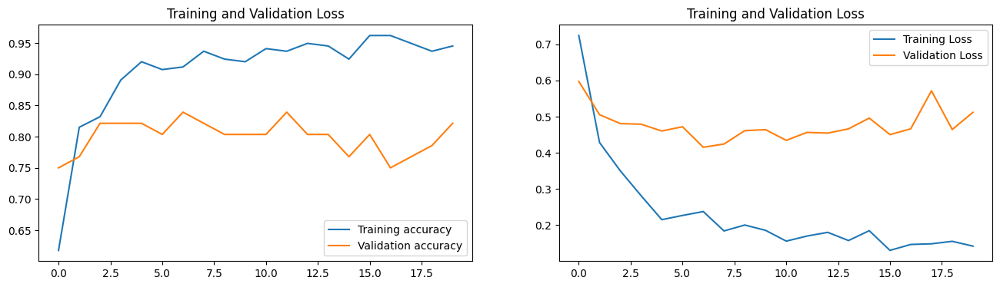

In [ ]:
training_history(history.history)

In [ ]:
class_names = ['Normal', 'Mitosis']

1/1 [==============================] - 5s 5s/step
              precision    recall  f1-score   support

      Normal       0.83      0.71      0.77         7
     Mitosis       0.75      0.86      0.80         7

    accuracy                           0.79        14
   macro avg       0.79      0.79      0.78        14
weighted avg       0.79      0.79      0.78        14

f1_score        : 0.7857142857142857
accuracy_score  : 0.7857142857142857


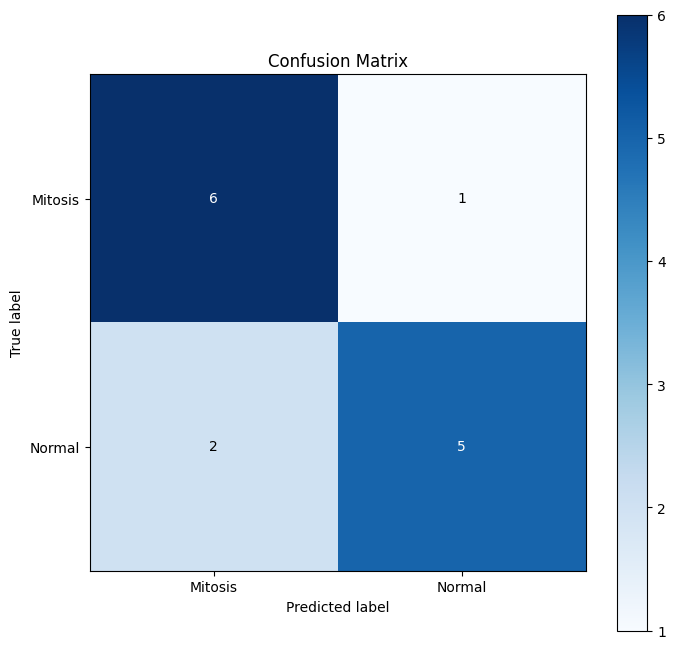

In [ ]:
test_df = test_df.sample(frac=1).reset_index(drop=True)
test_ds = tf.data.Dataset.from_tensor_slices(test_df.Image_Path)
test_ds = test_ds.map(decode_test,num_parallel_calls=AUTOTUNE).batch(len(test_df))
test_img = next(iter(test_ds))
test_index = test_df.label_int.values
test_label = test_df.Label.values

test_pred = model.predict(test_ds)
pred_index = np.round(test_pred).astype('uint8')
pred_label = np.array(class_names)[pred_index]

print(classification_report(test_index, pred_index, target_names=class_names,zero_division=0))
print('f1_score        :', f1_score(test_index, pred_index, average='micro'))
print('accuracy_score  :', accuracy_score(test_index, pred_index))

cm = skplt.metrics.plot_confusion_matrix(test_label, pred_label, figsize=(8, 8), normalize=False)

In [ ]:

test_ds = tf.data.Dataset.from_tensor_slices(df_test.Image_Path)
test_ds = test_ds.map(decode_test, num_parallel_calls=AUTOTUNE).batch(BATCH_SIZE)
# Make predictions on the test dataset
test_pred = model.predict(test_ds)

# Assuming binary classification (adjust accordingly for multiclass)
# You can set a threshold to convert probabilities to binary labels
threshold = 0.5
predicted_labels = (test_pred > threshold).astype(int)

# Assuming you have binary labels, you can use them directly
df_test['Predicted_Label'] = predicted_labels

# Display the predictions
print(df_test[['Image', 'Image_Path', 'Predicted_Label']])


7/7 [==============================] - 33s 4s/step
            Image                                         Image_Path  \
0   4000_1000.png  /content/drive/My Drive/Testing Image/4000_100...   
1   2000_3500.png  /content/drive/My Drive/Testing Image/2000_350...   
2   5500_2500.png  /content/drive/My Drive/Testing Image/5500_250...   
3   1000_4500.png  /content/drive/My Drive/Testing Image/1000_450...   
4   2500_2000.png  /content/drive/My Drive/Testing Image/2500_200...   
..            ...                                                ...   
94  1000_4000.png  /content/drive/My Drive/Testing Image/1000_400...   
95  1500_2500.png  /content/drive/My Drive/Testing Image/1500_250...   
96  5500_4000.png  /content/drive/My Drive/Testing Image/5500_400...   
97  6500_2500.png  /content/drive/My Drive/Testing Image/6500_250...   
98  1500_4500.png  /content/drive/My Drive/Testing Image/1500_450...   

    Predicted_Label  
0                 1  
1                 1  
2                 

In [ ]:
class_names = ['Normal', 'Mitosis']

# Map predicted labels to class names
df_test['Predicted_Class'] = df_test['Predicted_Label'].map({0: 'Normal', 1: 'Mitosis'})

# Display the predictions
print(df_test[['Image', 'Image_Path', 'Predicted_Class']])


            Image                                         Image_Path  \
0   4000_1000.png  /content/drive/My Drive/Testing Image/4000_100...   
1   2000_3500.png  /content/drive/My Drive/Testing Image/2000_350...   
2   5500_2500.png  /content/drive/My Drive/Testing Image/5500_250...   
3   1000_4500.png  /content/drive/My Drive/Testing Image/1000_450...   
4   2500_2000.png  /content/drive/My Drive/Testing Image/2500_200...   
..            ...                                                ...   
94  1000_4000.png  /content/drive/My Drive/Testing Image/1000_400...   
95  1500_2500.png  /content/drive/My Drive/Testing Image/1500_250...   
96  5500_4000.png  /content/drive/My Drive/Testing Image/5500_400...   
97  6500_2500.png  /content/drive/My Drive/Testing Image/6500_250...   
98  1500_4500.png  /content/drive/My Drive/Testing Image/1500_450...   

   Predicted_Class  
0          Mitosis  
1          Mitosis  
2          Mitosis  
3          Mitosis  
4          Mitosis  
..       

In [ ]:
df = df_test.drop('Predicted_Label', axis=1)

In [ ]:
# Drop the 'Path' column before saving
df = df.drop('Image_Path', axis=1)


In [ ]:
df.to_csv('predicted_labels.csv', index=False)

In [ ]:
df.head(10)

,Image,Predicted_Label,Predicted_Class
0,4000_1000.png,1,Mitosis
1,2000_3500.png,1,Mitosis
2,5500_2500.png,1,Mitosis
3,1000_4500.png,1,Mitosis
4,2500_2000.png,1,Mitosis
5,1500_4000.png,1,Mitosis
6,5000_4500.png,1,Mitosis
7,5000_500.png,1,Mitosis
8,1000_3000.png,1,Mitosis
9,4500_0.png,0,Normal


Count of Normal    :  22
Count of Mitosis :  77


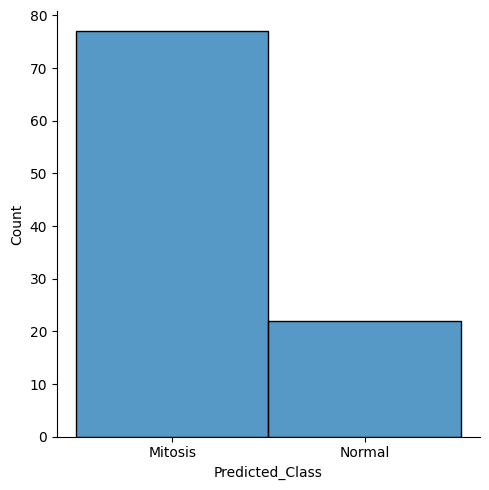

In [ ]:
ax = sns.displot(data=df, x='Predicted_Class')
print('Count of Normal    : ', df[df.Predicted_Class == 'Normal'].Predicted_Class.count())
print('Count of Mitosis : ', df[df.Predicted_Class == 'Mitosis'].Predicted_Class.count())

In [ ]:
import pandas as pd

# Merge the two files based on the 'Image' column
merged_df = pd.merge(file2, file1, how='left', left_on='Image', right_on='Image')

# Rename the 'Predicted_Class' column to 'Predicted_Label'
merged_df = merged_df.rename(columns={'Predicted_Class': 'L'})

# Save the merged dataframe to a new CSV file
merged_df.to_csv('merged_output.csv', index=False)


In [ ]:
merged_df.to_csv('fiza.csv', index=False)

In [ ]:
# Read the first CSV file
import pandas as pd
file1 = pd.read_csv('/content/AIC-2306_submission .csv', delimiter='\t')

# Read the second CSV file
file2 = pd.read_csv('peol.csv', delimiter='\t')


In [ ]:

# Specify the column to merge on (replace 'Image' with the correct column name)
merge_column = 'Image'

# Merge the two files based on the specified column, taking the first value in case of duplicates
merged_df = pd.merge(file1, file2, how='left', left_on=merge_column, right_on=merge_column, suffixes=('_file1', '_file2'))

# Rename the 'Predicted_Class' column to 'Predicted_Label'
merged_df = merged_df.rename(columns={'Predicted_Class': 'Label'})

# Save the merged dataframe to a new CSV file
merged_df.to_csv('merged_output.csv', index=False)

KeyError: 'Image'

In [ ]:
merge_column = 'Image'

# Drop duplicates in both files based on the specified column
file1 = file1.drop_duplicates(subset=merge_column)
file2 = file2.drop_duplicates(subset=merge_column)

# Merge the two files based on the specified column, taking the first value in case of duplicates
merged_df = pd.merge(file1, file2, how='left', left_on=merge_column, right_on=merge_column, suffixes=('_file1', '_file2'))

# Rename the 'Predicted_Class' column to 'Predicted_Label'
merged_df = merged_df.rename(columns={'Predicted_Class': 'Predicted_Label'})

# Save the merged dataframe to a new CSV file
merged_df.to_csv('merged_output.csv', index=False)

KeyError: Index(['Image'], dtype='object')

In [ ]:
file1 = pd.read_csv('/content/AIC-2306_submission .csv', delimiter='\t')
print("Columns in file1:", file1.columns)

# Check for any leading or trailing whitespaces in the column names
file1.columns = file1.columns.str.strip()

# Drop duplicates in both files based on the specified column
file1 = file1.drop_duplicates(subset=merge_column)
file2 = file2.drop_duplicates(subset=merge_column)

# Merge the two files based on the specified column, taking the first value in case of duplicates
merged_df = pd.merge(file1, file2, how='left', left_on=merge_column, right_on=merge_column, suffixes=('_file1', '_file2'))

# Rename the 'Predicted_Class' column to 'Predicted_Label'
merged_df = merged_df.rename(columns={'Predicted_Class': 'Predicted_Label'})

# Save the merged dataframe to a new CSV file
merged_df.to_csv('merged_output.csv', index=False)

Columns in file1: Index(['Image,Label'], dtype='object')


KeyError: Index(['Image'], dtype='object')

In [ ]:
file1 = pd.read_csv('takelabel.csv')

In [ ]:
file2 = pd.read_csv('takeimage.csv')

In [ ]:
file2.head(5)

,Image,Predicted_Class
0,4000_1000.png,Mitosis
1,2000_3500.png,Mitosis
2,5500_2500.png,Normal
3,1000_4500.png,Mitosis
4,2500_2000.png,Mitosis


In [ ]:
file1['Image'].drop_duplicates

<bound method Series.drop_duplicates of 0           0_0.png
1        0_1500.png
2        0_2500.png
3        0_3500.png
4        0_4000.png
          ...      
94    6500_4500.png
95       7000_0.png
96    7000_1000.png
97    7000_2000.png
98    1500_4500.png
Name: Image, Length: 99, dtype: object>

In [ ]:
print(merged_df)

            Image    Label
0   4000_1000.png  Mitosis
1   2000_3500.png  Mitosis
2   5500_2500.png  Mitosis
3   1000_4500.png   Normal
4   2500_2000.png  Mitosis
..            ...      ...
94  1000_4000.png   Normal
95  1500_2500.png  Mitosis
96  5500_4000.png  Mitosis
97  6500_2500.png   Normal
98  1500_4500.png  Mitosis

[99 rows x 2 columns]


In [ ]:
# Drop the first 'Label' column
merged_df = merged_df.drop(columns=['L'])
